# Time-Stepping vs. Harmonic Balancing for the One-Dimensional Linear Scalar Advection Equation and Burgers Equation with Sinusoidal Forcing 

## Import Packages 

In [1]:
using LinearAlgebra
using BoundaryValueDiffEq
using DifferentialEquations
using SparseArrays
using FFTW 
using BenchmarkTools 
using Plots 

## To do: 

## Section 1: Introduction 

The <b>motivation</b> for considering the one-dimensional scalar advection equation is the fact that the one-dimensional shallow water equations can be viewed as a system of two coupled scalar advection equations. The first and second of these equations are the transport equations for water height and water $x$-velocity, respectively.  

In the following, we will consider both linear and non-linear problems.

### Section 1.1: Linear Problem 

Assume that $\gamma$ denotes the linear damping coefficient as before. We study the classical linear scalar advection equation $u_t + c \, u_x = -\gamma u + F_d(x,t)$ (cfr. modeling of flow through porous media). This equation is extensively described in literature. For the case in which $\gamma =0$, see e.g. [advection equation lecture notes](https://www.uni-muenster.de/imperia/md/content/physik_tp/lectures/ws2016-2017/num_methods_i/advection.pdf). The equation describes the space-time evolution of the concentration $u(x,t)$ of a species or die with a constant velocity $c$. We study two cases. In the first case, the equation is unforced, i.e., we set $F_d(x,t) = 0$. In the second case, the equation is sinusoidally forced with driving angular frequency $\omega_d = 2 \pi f_d$ (observe the factor $2 \pi$) and spatially distributed amplitude $F_0(x)$, i.e., we set $F_d(x,t) = F_0(x) \, \sin(\omega \, t)$. The exact form of $F_0(x)$ is left to be specified.   

<b>Linear Scalar Advection Problem to Solve</b> Let $x \in \Omega=(0,L)$ denote the spatial domain (results in sympy show that the length of the computational domain seems to matter). Let $t \in [0,T]$ denote the time interval. Let $c>0$ denote the velocity of wave propagation (the direction of the wave propagation will be taken into account further later in these notes). Let $F_d(x,t)$ denote the (periodic or otherwise) forcing. The partial differential equation for the unknown $u(x,t)$ we intend to solve can be written as 

$$
\frac{\partial \, u}{\partial t} + c \frac{\partial \, u}{\partial x} = F_d(x,t) 
$$ 

The +-sign in the left-hand side was choosen deliberately. (Later we can add diffusion and linear and non-linear friction terms to the equation.) We supply either a Dirichlet boundary conditions in $x=0$ or periodic boundary condition for $u(x,t)$, i.e., we impose that 

$$
u(x=0,t) = u_0 \text{ or } u(0,t) = u(1,t) \, . 
$$

We impose non-zero initial conditions for $u(x,t)$ and zero initial conditions for $\dot{u}(x,t)$, i.e., we impose that

$$
u(x,0) = u_0(x) \, . $$

(Should we take $u_0(x)$ as a Gauss pulse traveling from left to right?)

<b>Reference Solution for Unforced Case</b> In case that $F_d(x,t) = 0$ (no external forcing), an <b>analytical reference solution</b> is given by $u(x,t) = g(\xi)$, where g is an arbitrary function of $\xi = x - c*t$ (method of charateristics, verify by applying chain rule for derivatives). The graph of the function $g(\xi)$ is advected from left to right as time passes (flip sign to obtain propagation in opposite direction).

<b>Reference Solution for Periodically Forced Case</b> In case that $F_d(x,t)$ is sinusoidal with angular driving frequency $\omega_d$ and spatially varying amplitude $F_0(x)$, we write $F_d(x,t) = F_0(x) \, \sin(\omega_d \, t)$. A reference solution (showing resonance as before), is given in e.g. [egger-2003](https://journals.ametsoc.org/view/journals/mwre/131/5/1520-0493_2003_131_0984_aewofn_2.0.co_2.xml?tab_body=pdf). Alternatively, rely on the harmonic balance method (as an exact method in the linear case) to generate a reference solution. 

<b>Harmonic Balance Method: Version-1: Continuous in Space</b> 

Single frequency solution at angular frequency $\omega_d$ and amplitudes $A_c(x) \in C^2([0,1])$ and $B_s(x) \in C^2([0,1])$

$$
u^{hb}(x,t) =  A_c(x) \, \cos(\omega_d \, t) + B_s(x) \, \sin(\omega_d \, t). 
$$

supplies with boundary conditions $A_c(x=0) = 0$ and $B_s(x=0) = 0$. This solution corresponds to the initial solution 

$$
u^{hb}(x,t=0) =  A_c(x) \, . 
$$

Therefore 

$$
\frac{\partial \, u^{hb}(x,t)}{\partial t} = 
  - \omega_d \, A_c(x) \, \sin(\omega_d \, t) + \omega_d \, B_s(x) \, \cos(\omega_d \, t) 
$$

$$
\frac{\partial \, u^{hb}(x,t)}{\partial x} =
  \frac{d \, A_c(x)}{dx} \, \cos(\omega_d \, t) +  
  \frac{d \, B_s(x)}{dx} \, \sin(\omega_d \, t) = 
  A_c'(x) \, \cos(\omega_d \, t) + B_s'(x) \, \sin(\omega_d \, t) \, .  
$$

In case of sinusoidal forcing, applying balancing of the harmonic results in the following coupled sytem of first order ordinary differential equations is arrived at   

$$ c \, A_c'(x) + \omega_d \, B_s(x) +  \gamma A_c(x) = 0 $$
$$ c \, B_s'(x) - \omega_d \, A_c(x) +  \gamma B_s(x) = F_0(x) \,, $$

or, after dividing both equations by $xc$ and introducing the wave number $k = \omega_d / c$

$$ A_c'(x) + k \, B_s(x) +  \gamma/c A_c(x) = 0 $$
$$ B_s'(x) - k \, A_c(x) +  \gamma/c B_s(x) = F_0(x) \, .$$

In the case without damping (i.e. $\gamma = 0$), we obtain by differentiating the first equation that $B_s'(x) = - 1 / k \, A_c$ or $c \, B_s'(x) = - c / k \, A_c$. Substituting in the second, we arrive at a Helmholtz equation for $A_c(x)$

$$
A_c''(x) - \omega_d^2/c^2 \, A_c(x) = \omega_d/c^2 \, F_0(x)
$$

(Need to correct typos) Having solved for $A_c(x)$, the solution for $B_s(x)$ can be constructed via $B_s(x) = c / \omega_d A'_c(x)$. Proceeding in this way allows to contruct analytical reference solution that can be useful in validating numerical approximations.  

<b>Remark</b> In case that the single harmonic anzats for the harmonic balance solution is extended with a term independent in time as 

$$
u^{hb}(x,t) =  C_0(x) + A_c(x) \, \cos(\omega_d \, t) + B_s(x) \, \sin(\omega_d \, t) \, . 
$$

the equation added is $C'(x) = 0$ which supplied with the initial condition $C'(x=0) = 0$ implies that $C'(x) = 0$. Adding the time-independent term in the harmonic balance anzats is thus not required in the linear case. 

<b>Finite Difference Spatial Discretization</b> We apply the method of lines. We use a finite difference method on a uniform mesh for the discretization of the spatial variable. We assume an uniform mesh with $N$ elements, $N+1$ nodes ($N-1$ internal nodes plus the left-most and right-most boundary node) and mesh spacing $h = 1/N$. Resulting systm of coupled partial differential equations 

$$
  \frac{d \, {\mathbf u}(t)}{dt} = c \, B \, {\mathbf u}(t) + {\mathbf F}_0 \, \sin(\omega_d \, t) 
$$

where $B$ is the discretization of the advection perator $\frac{\partial}{\partial x}$. In a first instance we use the first order backward difference scheme. This choice is motivated by the wish to capture the propagation of the wave left to right.

<b>Time Stepping</b> To perform time-stepping, we employ DifferentialEquations.jl.   

<b>Harmonic Balance Solution: Version-2: Discrete in Space</b>
Solve linear system for the vectors of amplitudes ${\mathbf A}_c \in {\mathbb R}^{N+1}$ and ${\mathbf B}_s \in {\mathbb R}^{N+1}$ for various angular frequencies.  

$$
{\mathbf u}^{hb}(t) =  {\mathbf A}_c \, \cos(\omega_d \, t) + {\mathbf B}_s \, \sin(\omega_d \, t) 
  \in {\mathbb R}^{N+1} \; \forall t \, . 
$$

Resulting system of linear equations 

$$
\begin{pmatrix}  c \, B & -\omega_d \, I \\ \omega_d \, I &  c \, B \end{pmatrix}
  \begin{pmatrix} {\mathbf A}_c \\ {\mathbf B}_s \end{pmatrix} = 
  \begin{pmatrix} 0 \\ {\mathbf F}_0 \end{pmatrix}  
$$

supplied with boundary conditions in the first component of ${\mathbf A}_c$ and ${\mathbf B}_s$. 

<b>Frequency Response</b>

### Section 1.2: Non-Linear Problem (Non-Linear Convective Term) 

Burgers equation without external forcing 

\$$
\frac{\partial u}{\partial t} + 1/2 \frac{\partial u^2}{\partial x} = 0  
$$

Burgers equation with external forcing 

$$
\frac{\partial \, u}{\partial t} + u \frac{\partial \, u}{\partial x} = F_d(x,t) = F_0(x) \, \sin(\omega_d \, t) 
$$ 

Burgers equation with less pain (by adding a non-linear term to the linear equation) and with external forcing 

$$
\frac{\partial \, u}{\partial t} + c \frac{\partial \, u}{\partial x}
  + 0.5 * u \frac{\partial \, u}{\partial x} 
  = F_d(x,t) = F_0(x) \, \sin(\omega_d \, t) 
$$ 

<b>Harmonic Balance Solution: Version-1: Continuous in Space: One Harmonic </b> 

$$
u^{hb}(x,t) =  C_o(x) + A_c(x) \, \cos(\omega_d \, t) + B_s(x) \, \sin(\omega_d \, t) \, . 
$$

<b>Harmonic Balance Solution: Version-1: Continuous in Space: Two Harmonics </b> 

Single frequency solution at angular frequency $\omega_d$ and amplitude $C_0(c), A_c(x),B_s(x), C_c(x), D_s(x) \in C^2([0,1])$

$$
u^{hb}(x,t) =  C_o(x) + A_c(x) \, \cos(\omega_d \, t) + B_s(x) \, \sin(\omega_d \, t) + 
               C_c(x) \, \cos(2 \, \omega_d \, t) + D_s(x) \, \sin(2 \, \omega_d \, t). 
$$

Substitution in Burgers equation  

$$
u^{hb}(x,t) \, \frac{\partial \, u^{hb}(x,t)}{\partial x} =
  \left[ A_c(x) \, \cos(\omega_d \, t) + B_s(x) \, \sin(\omega_d \, t) + 
         C_c(x) \, \cos(2 \, \omega_d \, t) + D_s(x) \, \sin(2 \, \omega_d \, t) \right] \, 
  \left[ A_c'(x) \, \cos(\omega_d \, t) + B_s'(x) \, \sin(\omega_d \, t) + 
         C_c'(x) \, \cos(2 \, \omega_d \, t) + D_s'(x) \, \sin(2 \, \omega_d \, t)\right] \\
  = \left[  \ldots \right] \, \cos(\omega_d \, t) +
    \left[  \ldots \right] \, \sin(\omega_d \, t) +
    \left[  \ldots \right] \, \cos(2 \, \omega_d \, t) +
    \left[  \ldots \right] \, \sin(2 \, \omega_d \, t) + \text{h.o.t.}
$$

Resulting system of first ordr non-linear coupled differential equations for the amplitudes $A_c(x)$, $B_s(x)$, $C_c(x)$ and $D_s(x)$


<b>Finite Difference Spatial Discretization</b> Spatial discretization of the non-linear term. 

<b>Time Stepping</b>    

<b>Harmonic Balance Solution: Version-2: Discrete in Space</b>

$$
{\mathbf u}^{hb}(t) = {\mathbf A}_c \, \cos(\omega_d \, t) + {\mathbf B}_s \, \sin(\omega_d \, t) 
  \in {\mathbb R}^{N+1} \; \forall t \, . 
$$

System of non-linear algebraic equations for ${\mathbf A}_c$ and ${\mathbf B}_s$   

## Section 2: Linear Problem: Harmonic Balance Method: Continuous in Space  

### Section 1.2: Auliary Functions 

In [2]:
# set source function 
src(x) = 1. 

# set right-hand side 
# u''(x) = - f(x) reformulated as 
# coupled first order system as 
# u'(x) = v(x) and v'(x) = - f(x) or 
# du[1] = u[2] and du[2] = - f(x) 
function rhs!(du, u, p, x)
    c, omd = p
    Ac = u[1]; Bs = u[2]
    du[1] = omd/c*Bs
    du[2] = -omd/c*Ac - src(x)/c 
end

# set boundary conditions 
# boundary conditions on the left and right of computational domain 
# requires explaining syntax 
function bc(residual, u, p, x)
    Acleft = 0; Bsleft=0; 
    residual[1] = u[1][1] - Acleft 
    residual[2] = u[1][2] - Bsleft 
end

bc (generic function with 1 method)

### Section 2.2: Solve 

In [3]:
# set constants 
c = 0.2
omd = 2*pi
p = [c, omd]

omdstep = 1. 
omdvec  = 0.:omdstep:10. |> collect 

# set domain size 
xspan = (0.,1.)

# set initial guess 
start = [1., 1.]

# store parameter value in p  
p = [c, omd]
    
# define and solve the problem 
bvp = BVProblem(rhs!, bc, start, xspan,p)
sol = solve(bvp, MIRK4(), dt = 0.005)
solbvp = sol; 

### Section 3.2: Post-Processing 

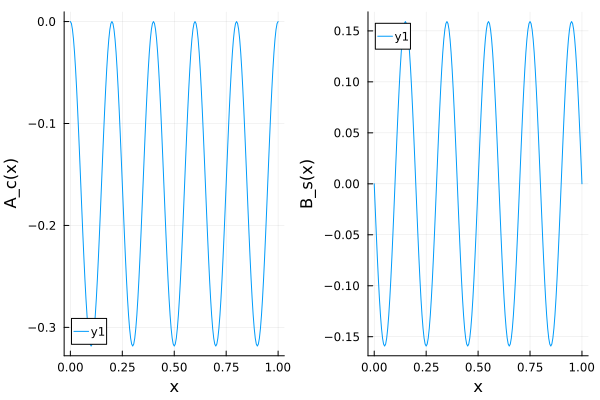

In [4]:
# plot u(x) and du/dx(x)
Ac = [u[1] for u in sol.u]
Bs = [u[2] for u in sol.u]
p1 = plot(sol.t, Ac, xlabel="x", ylabel = "A_c(x)") 
p2 = plot(sol.t, Bs, xlabel="x", ylabel = "B_s(x)") 
plot(p1,p2,layout=(1,2))

### Section 4.2: Plot solution in space-time domain 

Construct solution in time domain by outer product of two vectors, one in space, the other in time. 

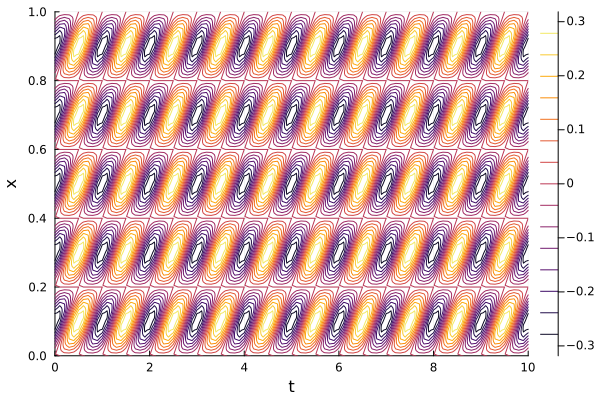

In [5]:
tend = 10; dt = 0.1; 
tvec = 0:dt:tend |> collect
ucost = cos.(omd*tvec); usint = sin.(omd*tvec)
myU = Ac*ucost' - Bs*usint'
contour(tvec,sol.t,myU,xlabel="t",ylabel="x")

### Section 5.2: Spectral Analysis of Time Traces (How to Use FFT) 
We illustrate how FFT can be used to recover the driving frequency from the computed solution. This serves as reference material for later. 

#### Plot Time Traces at Three x-Locations 

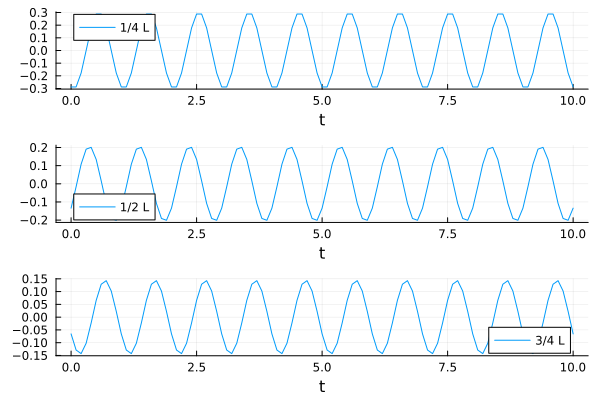

In [6]:
# plot time traces 
up1 = myU[size(myU)[2]÷4,:]
up2 = myU[size(myU)[2]÷2,:]
up3 = myU[3*size(myU)[2]÷4,:]

p1 = plot(tvec,up1,xlabel="t",label="1/4 L")
p2 = plot(tvec,up2,xlabel="t",label="1/2 L")
p3 = plot(tvec,up3,xlabel="t",label="3/4 L")
plot(p1,p2,p3,layout=(3,1)) 

#### Perform FFT and Show Results  

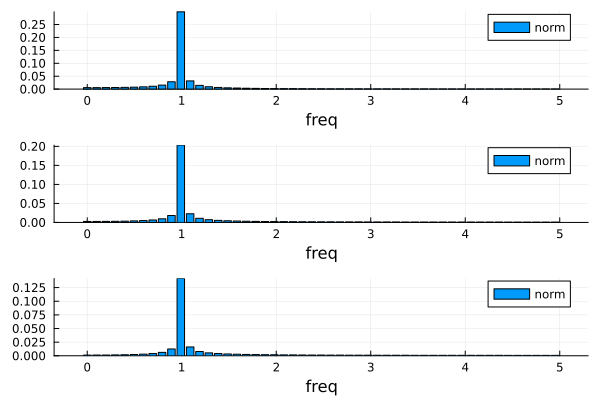

In [7]:
Nsamples = length(tvec)

# perform FFT of sampled position data 
ufp1 = fft(up1); ufp1 = 2.0/Nsamples * ufp1 
ufp2 = fft(up2); ufp2 = 2.0/Nsamples * ufp2
ufp3 = fft(up3); ufp3 = 2.0/Nsamples * ufp3

#..set frequency axis 
fmax = 1/(2.0*dt)
fstep = 2*fmax/Nsamples
fvec = Vector(0:fstep:fmax)

p1 = bar(fvec, abs.(ufp1)[1:length(fvec)],xlabel="freq",label="norm")
p2 = bar(fvec, abs.(ufp2)[1:length(fvec)],xlabel="freq",label="norm")
p3 = bar(fvec, abs.(ufp3)[1:length(fvec)],xlabel="freq",label="norm")
plot(p1,p2,p3,layout=(3,1))

## Section 3: Non-Linear Problem: Harmonic Balance Method: Continuous in Space

### Section 1.3: Auxiliary Functions 

In [8]:
# set source function 
src(x) = 1. 

# set right-hand side 
# u''(x) = - f(x) reformulated as 
# coupled first order system as 
# u'(x) = v(x) and v'(x) = - f(x) or 
# du[1] = u[2] and du[2] = - f(x) 
function rhs!(du, u, p, x)
    c, omd = p
    C = u[1]; A = u[2]; B = u[3]
    dC = du[1]; dA = du[2]; dB = du[3]
    nonlinscaling = 0.2
    du[1] = nonlinscaling*(A*dA+B*dB+C*dC)
    du[2] = omd/c*B + nonlinscaling*(A*dC+C*dA) 
    du[3] = -omd/c*A - src(x)/c + nonlinscaling*(B*dC+C*dB) 
end

# set boundary conditions 
# boundary conditions on the left and right of computational domain 
# requires explaining syntax 
function bc(residual, u, p, x)
    Cleft = 0; Aleft = 0; Bleft=0; 
    residual[1] = u[1][1] - Cleft
    residual[2] = u[1][2] - Aleft 
    residual[3] = u[1][3] - Bleft 
end

bc (generic function with 1 method)

### Section 2.3: Solve 

In [9]:
# set constants 
c = 0.2
omd = 2*pi
p = [c, omd]

omdstep = 1. 
omdvec  = 0.:omdstep:10. |> collect 

# set domain size 
xspan = (0.,1.)

# set initial guess 
start = [0., 1., 1.]

# store parameter value in p  
p = [c, omd]
    
# define and solve the problem 
bvp = BVProblem(rhs!, bc, start, xspan,p)
sol = solve(bvp, MIRK4(), dt = 0.005);

### Section 3.3: Postprocesing 

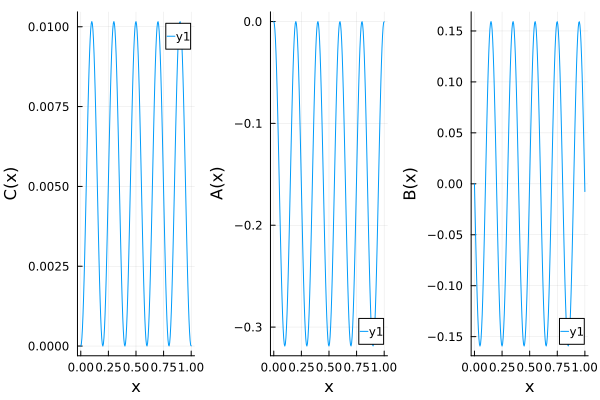

In [10]:
# plot u(x) and du/dx(x)
myC = [u[1] for u in sol.u]
myA = [u[2] for u in sol.u]
myB = [u[3] for u in sol.u]
p1 = plot(sol.t, myC, xlabel="x", ylabel = "C(x)") 
p2 = plot(sol.t, myA, xlabel="x", ylabel = "A(x)") 
p3 = plot(sol.t, myB, xlabel="x", ylabel = "B(x)") 
plot(p1,p2,p3,layout=(1,3))

### Section 4.3: Plot solution in space-time domain 

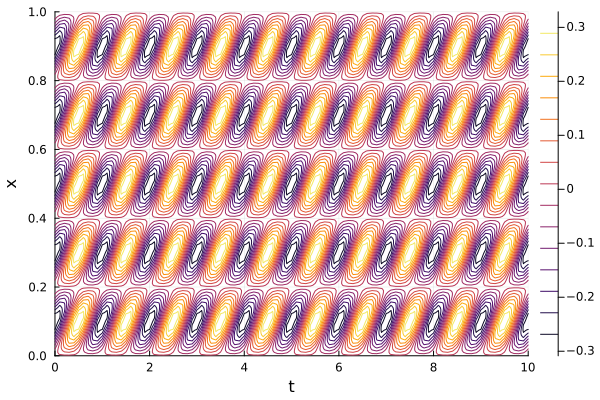

In [11]:
tend = 10; dt = 0.1; 
tvec = 0:dt:tend |> collect
ucost = cos.(omd*tvec); usint = sin.(omd*tvec)
myU = myC .+ myA*ucost' - myB*usint'
contour(tvec,sol.t,myU,xlabel="t",ylabel="x")

### Section 5.3: Spectral Analysis of Time Traces 

#### Plot Time Traces at Three x-Locations 

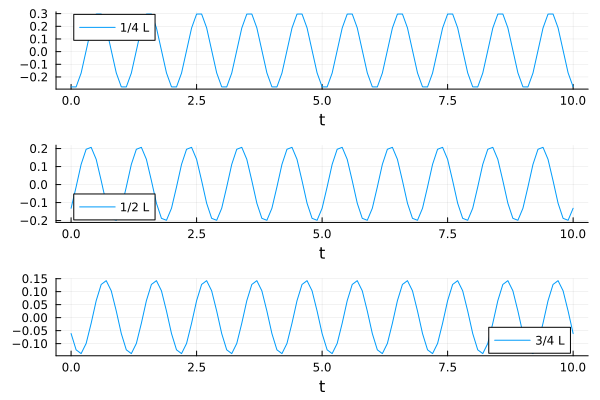

In [12]:
# plot time traces 
up1 = myU[size(myU)[2]÷4,:]
up2 = myU[size(myU)[2]÷2,:]
up3 = myU[3*size(myU)[2]÷4,:]

p1 = plot(tvec,up1,xlabel="t",label="1/4 L")
p2 = plot(tvec,up2,xlabel="t",label="1/2 L")
p3 = plot(tvec,up3,xlabel="t",label="3/4 L")
plot(p1,p2,p3,layout=(3,1)) 

#### Perform FFT and Show Results  

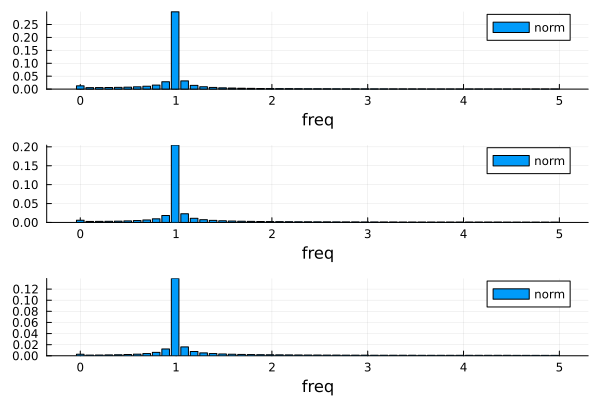

In [13]:
Nsamples = length(tvec)

# perform FFT of sampled position data 
ufp1 = fft(up1); ufp1 = 2.0/Nsamples * ufp1 
ufp2 = fft(up2); ufp2 = 2.0/Nsamples * ufp2
ufp3 = fft(up3); ufp3 = 2.0/Nsamples * ufp3

#..set frequency axis 
fmax = 1/(2.0*dt)
fstep = 2*fmax/Nsamples
fvec = Vector(0:fstep:fmax)

p1 = bar(fvec, abs.(ufp1)[1:length(fvec)],xlabel="freq",label="norm")
p2 = bar(fvec, abs.(ufp2)[1:length(fvec)],xlabel="freq",label="norm")
p3 = bar(fvec, abs.(ufp3)[1:length(fvec)],xlabel="freq",label="norm")
plot(p1,p2,p3,layout=(3,1))

## Section 4: Analytical Reference Solution for Linear Equation without External Forcing 

To do:   
1. plot the wave travelling in opposite direction;
1. plot the wave with anti-periodic boundary conditions; 

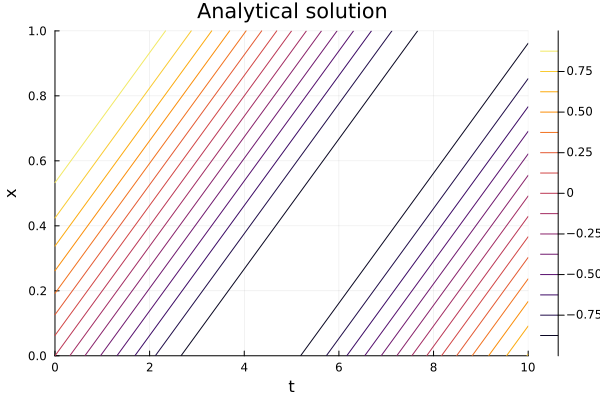

In [14]:
function sineWave(x,t,p)
    c, omd = p 
    xi = x-c*t
    return sin(omd*xi)
end 

function gaussWave(x,t,p)
    c, omd = p
    xi = x-c*t
    return exp(-(xi-.2)^2/0.01)
end 

# set number of elements in space, the number of time samples and number of modes 
nelements = 100
Nt = 1000

#..construct the 1D spatial x-mesh and the spatial modes 
nnodes = nelements+1; h = 1/nelements; h2=h*h; 
x = Vector(0:h:1); 

#..construct temporal t-mesh  
Tend = 10; dt = Tend/Nt; 
t = Vector(0:dt:Tend);

#..set wave velocity and damping coefficients 
c   = .2
omd = 2
p   = [c, omd]

#..initialize and construct analytical solution 
uanal = [sineWave(xi,tj,p) for xi in x, tj in t]

p1 = contour(t,x,uanal,xlabel="t",ylabel="x",title="Analytical solution")

plot(p1)

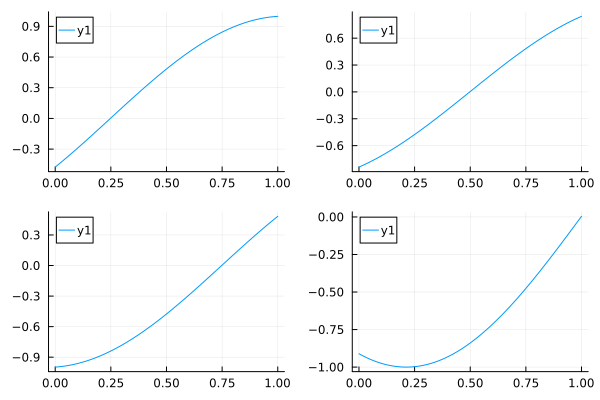

In [15]:
# plot time traces 
p1 = plot(x,uanal[:,Int64(Nt/8)])
p2 = plot(x,uanal[:,Int64(2*Nt/8)])
p3 = plot(x,uanal[:,Int64(3*Nt/8)])
p4 = plot(x,uanal[:,Int64(4*Nt/8)])
p5 = plot(x,uanal[:,Int64(5*Nt/8)])
p6 = plot(x,uanal[:,Int64(6*Nt/8)])
p7 = plot(x,uanal[:,Int64(7*Nt/8)])
p8 = plot(x,uanal[:,Int64(8*Nt/8)])
plot(p1,p2,p3,p4,layout=(2,2))
#plot(p5,p6,p7,p8,layout=(2,2))

## Section 5: Spatial Discretization: Construct the One-Dimensional Advection Matrix

1. using periodic boundary conditions, the linear algebra on a mesh with N+1 nodes leads to a linear system of size N-by-N. We omit the last node in the mesh. 
1. need to add upwind scheme? 
1. Implement backward difference scheme. 

In [16]:
# struct to hold entire mesh
struct Mesh
  #..number of nodes of the mesh..   
  nnodes::Int64
  #..number of elements of the mesh..
  nelements::Int64 
  #..vector of x-coordinates of nodes of the mesh..
  nodes::Vector{Float64}
  #..vector of x-coordinates of nodes of the mesh..
  midpoints::Vector{Float64}    
end 

# function to generate a mesh on the interval 0 <= x <= 1.   
# we limit the type of input to be Int64 
function genMesh(nelements::Int64)::Mesh
    h = 1/nelements 
    nnodes = nelements+1
    nodes = Vector{Float64}(0:h:1) 
    midpoints = nodes[1:end-1] + (nodes[2:end] - nodes[1:end-1])/2
    mesh = Mesh(nnodes,nelements,nodes,midpoints)     
    return mesh;
end 

# generate N-by-N advection matrix by backward difference scheme with mesh width h
# leading to lower (L) bi-diagonal matrix 
function genAdvMatL(mesh::Mesh)

    #..recover number of elements and nodes  
    nelements = mesh.nelements
    nnodes    = nelements+1
    
    #..set mesh width and square of mesh width 
    h = 1/nelements

    #..construct the advection matrix\ 
    e = ones(nnodes) 
    A = Bidiagonal(e, -e[2:end], :L)
    A = (1/h)*A     
   
    return A;     
end

# generate load vector of size N 
function genVector(mesh, sourceFct::F) where F 

    #..recover mesh nodes  
    nodes = mesh.nodes
    
    #..set vector values using broadcasting (dot syntax)  
    f = sourceFct.(nodes[1:end])
   
    return f; 
end

function genBoundariesL!(mesh,A,f)
    
    #..recover number of elements and nodes  
    nelements = mesh.nelements
    nnodes = mesh.nnodes 
    
    #..set mesh width and square of mesh width 
    h = 1/nelements
    
    A = sparse(A)
    # A[1,end] = -1/h   
    A[1,1] = 1.; A[1,2] = 0.

    return A,f   
end

function genBoundariesU!(mesh,A,f)
    
    #..recover number of elements and nodes  
    nelements = mesh.nelements
    nnodes = mesh.nnodes 
    
    #..set mesh width and square of mesh width 
    h = 1/nelements
    
    A = sparse(A)
    A[end,1] = 1/h   

    return A,f   
end

genBoundariesU! (generic function with 1 method)

Test above on small mesh. 

In [17]:
nelements = 4
mesh = genMesh(nelements)
myfct(x) = 0 
A = genAdvMatL(mesh); f = genVector(mesh, myfct) 
A,f = genBoundariesL!(mesh,A,f);
display(A)
#display(f)

5×5 SparseMatrixCSC{Float64, Int64} with 9 stored entries:
  1.0    ⋅     ⋅     ⋅    ⋅ 
 -4.0   4.0    ⋅     ⋅    ⋅ 
   ⋅   -4.0   4.0    ⋅    ⋅ 
   ⋅     ⋅   -4.0   4.0   ⋅ 
   ⋅     ⋅     ⋅   -4.0  4.0

## Section 6: Time Integration of the Linear Problem

We study three scenarios: 
1. propagation of a Gaussian wave: no external forcing and initial solution given by Gauss wave at $t=0$; 
1. propagation of a sine wave: as above with initial sinus wave; 
1. periodically driven source term: sinusoidally driven source term, not sure about the initial guess: what happens when increasing driving frequency or amplitude of the driving force?  

In [18]:
nelements = 1000
mesh = genMesh(nelements)
myfct(x) = 0 
J0 = genAdvMatL(mesh); f = genVector(mesh, myfct) 
J0,f = genBoundariesL!(mesh,J0,f);
f[1] = 1.; 

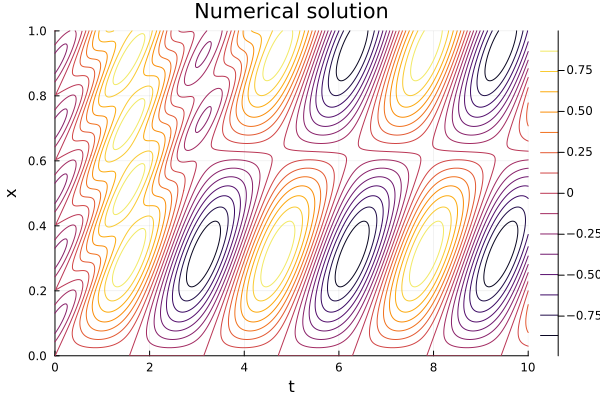

In [19]:
function no_external_forcing!(du,u,p,t)
    c, omd = p 
    du .= -c*J0*u 
end
 
function sinusoidal_forcing!(du,u,p,t)
    c, omd = p 
    du .= -c*(J0*u) .+ 1.0*sin(omd*t)
    du[1] = 0 
end

# set constants 
c = 0.2
omd = 2.

# store parameter value in p  
p = [c, omd]

# u0 = [0. for xi in mesh.nodes
# u0 = [gaussWave(xi,0,p) for xi in mesh.nodes]
# u0 = [sineWave(xi,0,p) for xi in mesh.nodes]
u0 = [solbvp(xi)[1] for xi in mesh.nodes]

tspan = (0.0,10)

prob = ODEProblem(sinusoidal_forcing!,u0,tspan,p)
sol = solve(prob, alg_hints = [:stiff], reltol = 1e-8, abstol = 1e-8, save_everystep = true);

# post processing 
posind = 1:(mesh.nnodes) 
myU = sol[posind,:]
p1  = contour(sol.t,mesh.nodes,myU,xlabel="t",ylabel="x")
title!("Numerical solution")

## Section 7:  Time Integration of the Non-Linear Problem

What initial solution to provide? Should non-linearity be ramped in time? 

In [20]:
ramp(t) = (t-1)*((t>=1)) - (t-2)*((t>=2)) 

tvec = 0:01:4 

plot(tvec,ramp2.(tvec))

LoadError: UndefVarError: `ramp2` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

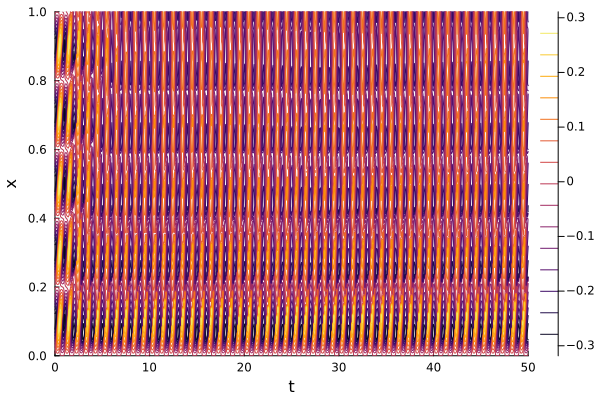

In [21]:
function sinusoidal_forcing!(du,u,p,t)
    c, omd = p 
    # du .= -c*(J0*u) .- (0.)*ramp(t)*u.*(J0*u) .+ 1.0*sin(omd*t) # linear case 
    du .= -c*(J0*u) .- 0.5*ramp(t)*u.*(J0*u) .+ 1.0*sin(omd*t) # non-linear case 
    du[1] = 0 
end

# set constants 
c = 0.2
# omd = 2.
omd = 2*pi 

# store parameter value in p  
p = [c, omd]

# initial solution 
u0 = [solbvp(xi)[1] for xi in mesh.nodes]

tspan = (0.0,50)

prob = ODEProblem(sinusoidal_forcing!,u0,tspan,p)
sol = solve(prob, alg_hints = [:stiff], reltol = 1e-8, abstol = 1e-8, save_everystep = true);

# post processing 
posind = 1:(mesh.nnodes) 
myU = sol[posind,:]
p1  = contour(sol.t,mesh.nodes,myU,xlabel="t",ylabel="x")

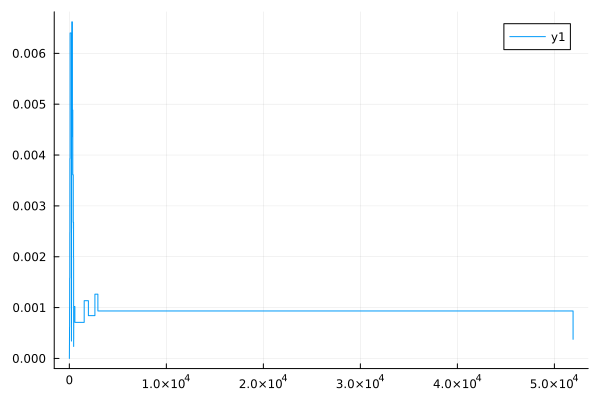

In [51]:
dtvec = sol.t[2:end] - sol.t[1:end-1] 
plot(dtvec)
#mean(dtvec)

## Section 8: Spectral Analysis for Time Traces 

Requires dt for determine the frequency axis.  

In [52]:
up1 = myU[nelements÷4,:]
up2 = myU[nelements÷2,:]
up3 = myU[3*nelements÷4,:]

myfirst = 2000

dtvec = sol.t[myfirst+1:end] - sol.t[myfirst:end-1] 
dt    = mean(dtvec)

p1 = plot(sol.t[myfirst:end],up1[myfirst:end],xlabel="t",label="1/4 L")
p2 = plot(sol.t[myfirst:end],up2[myfirst:end],xlabel="t",label="1/2 L")
p3 = plot(sol.t[myfirst:end],up3[myfirst:end],xlabel="t",label="3/4 L")
p4 = plot(dtvec, label="dt")
plot(p1,p2,p3,p4,layout=(4,1)) 

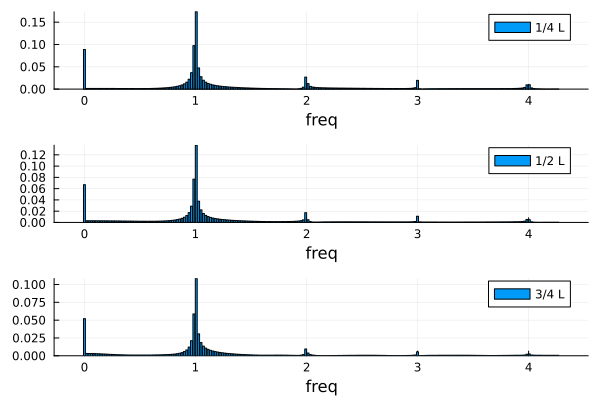

In [53]:
Nsamples = length(up1[myfirst:end])

# perform FFT of sampled position data 
ufp1 = fft(up1[myfirst:end]); ufp1 = 2.0/Nsamples * ufp1
ufp2 = fft(up2[myfirst:end]); ufp2 = 2.0/Nsamples * ufp2
ufp3 = fft(up3[myfirst:end]); ufp3 = 2.0/Nsamples * ufp3; 

#..set frequency axis 
fmax = 1/(2.0*dt)
fstep = 2*fmax/Nsamples
fvec = Vector(0:fstep:fmax)

mylast = 200
p1 = bar(fvec[1:mylast], abs.(ufp1)[1:mylast],xlabel="freq",label="1/4 L")
p2 = bar(fvec[1:mylast], abs.(ufp2)[1:mylast],xlabel="freq",label="1/2 L")
p3 = bar(fvec[1:mylast], abs.(ufp3)[1:mylast],xlabel="freq",label="3/4 L")
plot(p1,p2,p3,layout=(3,1))

## Section 9: Results Obtained From a Transient Analysis of Modified Burgers Equation with Periodic Forcing

<div>
<img src="./linear_advection_equation.png" width=600 /> 
</div>

<div>
<img src="./burgers_equation.png" width=600 /> 
</div>

## References 